# **STIB-MIVB Vehicle Positions: Exploratory Data Analysis (EDA)**

In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import folium as fl
import psycopg2
import psycopg2.extras as extras
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots
from psycopg2 import Error
from psycopg2.extensions import ISOLATION_LEVEL_AUTOCOMMIT
from plotly.subplots import make_subplots
from IPython.display import display, HTML, clear_output
from folium.plugins import HeatMap

pio.renderers.default = "plotly_mimetype+notebook"

## 1. Connect DB

In [2]:
# set up connection variables
db_host = "localhost"
db_port = "5432"
db_user = "postgres"
db_pass = "hope"
db_name = "stib_transport"

# function to connect with postgres
def connect_postgres(db_host, db_port, db_user, db_pass, db_name):
    try:
        # connect to an existing database
        connection = psycopg2.connect(host = db_host,
                                      port = db_port,
                                      user = db_user,
                                      password = db_pass,
                                      database = db_name)
        # set auto-commit
        connection.set_isolation_level(ISOLATION_LEVEL_AUTOCOMMIT);
        # create a cursor to perform database operations
        cur = connection.cursor()
        # print PostgreSQL details
        print("PostgreSQL server information")
        print(connection.get_dsn_parameters(), "\n")
        # execute a SQL query
        cur.execute("SELECT version();")
        # fetch result
        record = cur.fetchone()
        print("You are connected to - ", record, "\n")

    except (Exception, Error) as error:
        print("Error while connecting to PostgreSQL", error)
    else:
        return cur

In [3]:
# connect to postgres

cur = connect_postgres(db_host, db_port, db_user, db_pass, db_name)

PostgreSQL server information
{'user': 'postgres', 'dbname': 'stib_transport', 'host': 'localhost', 'port': '5432', 'tty': '', 'options': '', 'sslmode': 'prefer', 'sslcompression': '0', 'gssencmode': 'prefer', 'krbsrvname': 'postgres', 'target_session_attrs': 'any'} 

You are connected to -  ('PostgreSQL 14.5, compiled by Visual C++ build 1914, 64-bit',) 



In [4]:
stib_colors = [
    "#4169e1",
    "#ea4c46",
    "#ffc200",
]

In [5]:
# query 

cur.execute(
    f"""
    
    with base as (
        select
          vehicle
        , line
        , direction
        , stop_name
        , stop_seq
        , sched_timegroup
        , timegroup_start_in
        , timegroup_end_ex
        , (count(case when ewt_min < 3 then ewt_min end)::float/count(*)::float)::numeric(9, 2) as mins_less_than_3
        , (count(case when ewt_min >= 3 then ewt_min end)::float/count(*)::float)::numeric(9, 2) as mins_3_plus
        from ewt
        where day_category = 'Weekday'
        group by
              vehicle
            , line
            , direction
            , stop_name
            , stop_seq
            , sched_timegroup
            , timegroup_start_in
            , timegroup_end_ex
    )

    , agg2 as (
        select
          vehicle
        , line
        , direction
        , stop_name
        , avg(mins_less_than_3) as avg_mins_less_than_3
        , avg(mins_3_plus) as avg_mins_3_plus
        from base
        group by
              vehicle
            , line
            , direction
            , stop_name
    )

    , agg3 as (
        select
          vehicle
        , line
        , direction
        , avg(avg_mins_less_than_3)::numeric(9,2) as avg_mins_less_than_3
        , avg(avg_mins_3_plus)::numeric(9,2) as avg_mins_3_plus
        from agg2
        group by
              vehicle
            , line
            , direction
    )

    select * from agg3
        
    """
)

df = pd.DataFrame(cur.fetchall(), columns = [desc[0] for desc in cur.description])

In [6]:
dir_1 = df.loc[df.direction == 1]
dir_2 = df.loc[df.direction == 2]

def percent_cases_line_direction(df, direction):
    fig = px.bar(
        df, 
        x = 'line', 
        y = 'avg_mins_3_plus',
        color = 'vehicle',
        color_discrete_sequence = stib_colors,
        labels = {
            'line': 'Line',
            'avg_mins_3_plus': 'Average Proportion of Cases'
        },
        title = f'<span style = "font-size: 20px; font-weight: bold">Vehicle: Average Proportion of Cases with a 3mins+ EWT accross Lines (direction {direction})</span>'
    )


    fig.update_xaxes(ticks = "inside", tickcolor = 'white', tickangle = 45)

    fig.add_hline(y= 0.5, line_width = 3, line_dash = "dash", line_color = "black")
    fig.add_hline(y= 0.75, line_width = 3, line_dash = "dash", line_color = "orange")
    
    fig.add_annotation(
        x = 35, 
        y = 0.5,   
        text = f"50%",
        showarrow = True,
        arrowhead = 1,
        bgcolor = 'lightgrey'
    )
    
    fig.add_annotation(
        x = 35, 
        y = 0.75,   
        text = f"75%",
        showarrow = True,
        arrowhead = 1,
        bgcolor = 'orange'
    )

    fig.show()

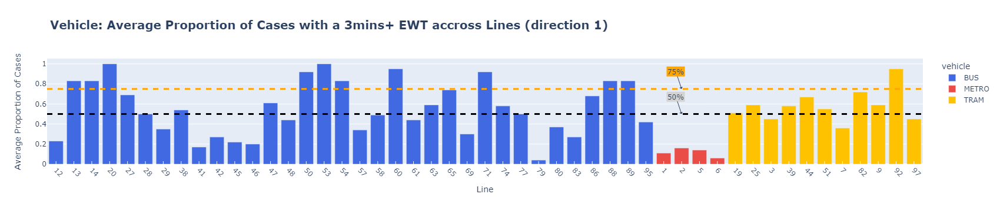

In [7]:
percent_cases_line_direction(dir_1, 1)

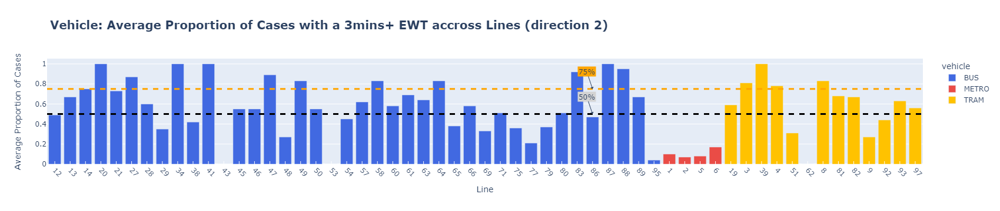

In [8]:
percent_cases_line_direction(dir_2, 2)

In [9]:
# load lines & stops from shapefile, as GeoDataFrame (gdf)

stib_lines = gpd.read_file("stib_data/network/preprocessed_lines/preprocessed_lines.shp")
stib_stops = gpd.read_file("stib_data/network/preprocessed_stops/preprocessed_stops.shp")

In [10]:
# query 

cur.execute(
    f"""
    
    with base as (
        select
          vehicle
        , line
        , direction
        , stop_name
        , stop_seq
        , sched_timegroup
        , timegroup_start_in
        , timegroup_end_ex
        , (count(case when ewt_min < 3 then ewt_min end)::float/count(*)::float)::numeric(9, 2) as mins_less_than_3
        , (count(case when ewt_min >= 3 then ewt_min end)::float/count(*)::float)::numeric(9, 2) as mins_3_plus
        from ewt
        where day_category = 'Weekday'
        group by
              vehicle
            , line
            , direction
            , stop_name
            , stop_seq
            , sched_timegroup
            , timegroup_start_in
            , timegroup_end_ex
    )

    , agg2 as (
        select
          vehicle
        , line
        , direction
        , stop_name
        , avg(mins_less_than_3) as avg_mins_less_than_3
        , avg(mins_3_plus) as avg_mins_3_plus
        from base
        group by
              vehicle
            , line
            , direction
            , stop_name
    )

    , agg3 as (
        select
          vehicle
        , stop_name
        , avg(avg_mins_less_than_3)::numeric(9, 2) as avg_mins_less_than_3
        , avg(avg_mins_3_plus)::numeric(9, 2) as avg_mins_3_plus
        from agg2
        group by
              vehicle
            , stop_name
    )

    select 
    vehicle,
    stop_name,
    avg_mins_3_plus
    from agg3
    -- where avg_mins_3_plus >= 0.7
    order by avg_mins_3_plus desc;
        
    """
)

stops_3_min_plus_ewt_percent = pd.DataFrame(cur.fetchall(), columns = [desc[0] for desc in cur.description])

In [11]:
stops = stib_stops.merge(
    stops_3_min_plus_ewt_percent,
    how = 'inner',
    left_on = ['vehicle', 'stop_name'],
    right_on = ['vehicle', 'stop_name']
).rename(
    columns = {
        'avg_mins_3_plus': 'avg_percent_ewt_3_mins_plus'
    }
)

stops.avg_percent_ewt_3_mins_plus = stops.avg_percent_ewt_3_mins_plus.astype('float64')

In [12]:
bus_lines = stib_lines.loc[stib_lines.vehicle == 'BUS']
tram_lines = stib_lines.loc[stib_lines.vehicle == 'TRAM']
metro_lines = stib_lines.loc[stib_lines.vehicle == 'METRO']

In [13]:
# plot interactive map

map_avg_percent_ewt_3_mins_plus = fl.Map(
    location = [50.8476, 4.3572],
    tiles = 'CartoDB positron',
    zoom_start = 13,
    control_scale = True
)

HeatMap(
    stops[['lat', 'lon', 'avg_percent_ewt_3_mins_plus']], 
    min_opacity = 0.2,
    blur = 18,
    overlay = True
).add_to(
    fl.FeatureGroup(
        name = 'Heat Map'
    ).add_to(
        map_avg_percent_ewt_3_mins_plus
    )
)

vehicle_colours = {'BUS': '#4169e1', 'TRAM': '#ea4c46', 'METRO': '#ffc200'}

for grp_name, df_grp in stib_lines.groupby('vehicle'):
    
    feature_group_stops = fl.FeatureGroup(grp_name + ' Stops', show = False)
        
    for index, data in stops.loc[(stops.vehicle == grp_name)].iterrows():
        fl.Circle(
            location = [data.lat, data.lon], 
            tooltip = data[['vehicle', 'line', 'direction', 'stop_seq', 'stop_name', 'end_stop']].to_dict(), 
            radius = 25, 
            color = vehicle_colours.get(grp_name), 
            fill = True
        ).add_to(feature_group_stops)
    
    feature_group_stops.add_to(map_avg_percent_ewt_3_mins_plus)
    
bus_lines_fg = fl.FeatureGroup(name = 'BUS Lines', show = False)
tram_lines_fg = fl.FeatureGroup(name = 'TRAM Lines', show = False)
metro_lines_fg = fl.FeatureGroup(name = 'METRO Lines', show = False)

fl.Choropleth(
    geo_data = bus_lines,
    line_color = '#4169e1',
    highlight = True
).add_to(bus_lines_fg)

fl.Choropleth(
    geo_data = tram_lines,
    line_color = '#ea4c46',
    highlight = True
).add_to(tram_lines_fg)

fl.Choropleth(
    geo_data = metro_lines,
    line_color = '#ffc200',
    highlight = True
).add_to(metro_lines_fg)

bus_lines_fg.add_to(map_avg_percent_ewt_3_mins_plus)
tram_lines_fg.add_to(map_avg_percent_ewt_3_mins_plus)
metro_lines_fg.add_to(map_avg_percent_ewt_3_mins_plus)

    
fl.LayerControl(collapsed = False).add_to(map_avg_percent_ewt_3_mins_plus)
map_avg_percent_ewt_3_mins_plus

In [14]:
# query 

cur.execute(
    f"""
    
    with base as (
        select
          vehicle
        , line
        , direction
        , stop_name
        , stop_seq
        , sched_timegroup
        , timegroup_start_in
        , timegroup_end_ex
        , (count(case when ewt_min < 3 then ewt_min end)::float/count(*)::float)::numeric(9, 2) as mins_less_than_3
        , (count(case when ewt_min >= 3 then ewt_min end)::float/count(*)::float)::numeric(9, 2) as mins_3_plus
        from ewt
        where day_category = 'Weekday'
        group by
              vehicle
            , line
            , direction
            , stop_name
            , stop_seq
            , sched_timegroup
            , timegroup_start_in
            , timegroup_end_ex
    )

    , time_buckets as (
        select
        *,
        generate_series(
            ('2021-09-06 ' || timegroup_start_in)::timestamp, 
            ('2021-09-06 ' || timegroup_end_ex)::timestamp, 
            '15 minutes'::interval
        ) as time_buckets
        from base
        where timegroup_end_ex > timegroup_start_in
        union all
        select
        *,
        generate_series(
            ('2021-09-06 ' || timegroup_start_in)::timestamp, 
            ('2021-09-07 ' || timegroup_end_ex)::timestamp, 
            '15 minutes'::interval
        ) as time_buckets
        from base
        where timegroup_end_ex < timegroup_start_in
    )

    , agg2 as (
        select
          vehicle
        , line
        , direction
        , time_buckets::time as time_buckets
        , avg(mins_less_than_3) as avg_mins_less_than_3
        , avg(mins_3_plus) as avg_mins_3_plus
        from time_buckets
        group by
              vehicle
            , line
            , direction
            , time_buckets::time
    )

    , agg3 as (
        select
          vehicle
        , time_buckets
        , avg(avg_mins_less_than_3)::numeric(9, 2) as avg_mins_less_than_3
        , avg(avg_mins_3_plus)::numeric(9, 2) as avg_mins_3_plus
        from agg2
        group by
              vehicle
            , time_buckets
    )

    select 
    vehicle,
    time_buckets,
    avg_mins_3_plus
    from agg3
    order by 
    -- vehicle, 
    case
        when (extract(hour from time_buckets) + (extract(minute from time_buckets)/60)) >= 5 then (extract(hour from time_buckets) + (extract(minute from time_buckets)/60))
        else (extract(hour from time_buckets) + (extract(minute from time_buckets)/60)) + 24
    end
    -- do a special sort to ensure that the output sorts from 5am as the start, to align with the way that stib schedules start on a daily basis
        
    """
)

time_bucket_3_min_plus_ewt_percent = pd.DataFrame(cur.fetchall(), columns = [desc[0] for desc in cur.description])

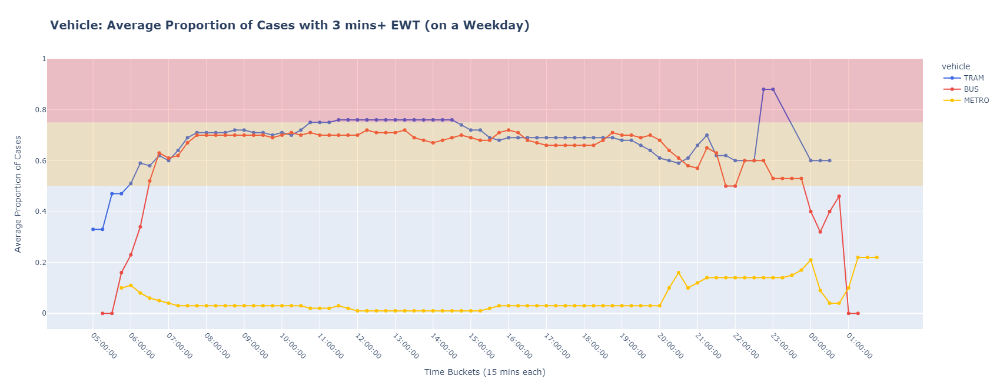

In [15]:
# visualize headways

fig = px.line(
    time_bucket_3_min_plus_ewt_percent, 
    x = 'time_buckets', 
    y = 'avg_mins_3_plus',
    color = 'vehicle',
    color_discrete_sequence = stib_colors,
    markers = True,
    labels = {
        'time_buckets': 'Time Buckets (15 mins each)',
        'avg_mins_3_plus': 'Average Proportion of Cases'
    },
    title = '<span style = "font-size: 20px; font-weight: bold">Vehicle: Average Proportion of Cases with 3 mins+ EWT (on a Weekday)</span>'
)

fig.add_hrect(y0 = 0.5, y1 = 0.75, line_width = 0, fillcolor = "orange", opacity = 0.2)
fig.add_hrect(y0 = 0.75, y1 = 1, line_width = 0, fillcolor = "red", opacity = 0.2)
fig.update_xaxes(categoryorder = 'array', categoryarray = time_bucket_3_min_plus_ewt_percent.time_buckets.drop_duplicates().tolist())
fig.update_xaxes(ticks = "inside", tickcolor = 'white', tickangle = 45, nticks = 24)
fig.update_layout(
    height = 650
)

fig.show()

In [16]:
# query 

cur.execute(
    f"""
    
    with base as (
        select
          day_category
        , vehicle
        , line
        , direction
        , stop_name
        , stop_seq
        , sched_timegroup
        , timegroup_start_in
        , timegroup_end_ex
        , (count(case when ewt_min < 3 then ewt_min end)::float/count(*)::float)::numeric(9, 2) as mins_less_than_3
        , (count(case when ewt_min >= 3 then ewt_min end)::float/count(*)::float)::numeric(9, 2) as mins_3_plus
        from ewt
        group by
              day_category
            , vehicle
            , line
            , direction
            , stop_name
            , stop_seq
            , sched_timegroup
            , timegroup_start_in
            , timegroup_end_ex
    )

    , time_buckets as (
        select
        *,
        generate_series(
            ('2021-09-06 ' || timegroup_start_in)::timestamp, 
            ('2021-09-06 ' || timegroup_end_ex)::timestamp, 
            '15 minutes'::interval
        ) as time_buckets
        from base
        where timegroup_end_ex > timegroup_start_in
        union all
        select
        *,
        generate_series(
            ('2021-09-06 ' || timegroup_start_in)::timestamp, 
            ('2021-09-07 ' || timegroup_end_ex)::timestamp, 
            '15 minutes'::interval
        ) as time_buckets
        from base
        where timegroup_end_ex < timegroup_start_in
    )

    , agg2 as (
        select
          day_category
        , line
        , direction
        , time_buckets::time as time_buckets
        , avg(mins_less_than_3) as avg_mins_less_than_3
        , avg(mins_3_plus) as avg_mins_3_plus
        from time_buckets
        group by
              day_category
            , line
            , direction
            , time_buckets::time
    )

    , agg3 as (
        select
          day_category
        , time_buckets
        , avg(avg_mins_less_than_3)::numeric(9, 2) as avg_mins_less_than_3
        , avg(avg_mins_3_plus)::numeric(9, 2) as avg_mins_3_plus
        from agg2
        group by
              day_category
            , time_buckets
    )

    select 
    day_category,
    time_buckets,
    avg_mins_3_plus
    from agg3
    -- where avg_mins_3_plus >= 0.7
    order by 
    -- day_category, 
    case
        when (extract(hour from time_buckets) + (extract(minute from time_buckets)/60)) >= 5 then (extract(hour from time_buckets) + (extract(minute from time_buckets)/60))
        else (extract(hour from time_buckets) + (extract(minute from time_buckets)/60)) + 24
    end
    -- do a special sort to ensure that the output sorts from 5am as the start, to align with the way that stib schedules start on a daily basis
        
    """
)

day_cat_time_bucket_3_min_plus_ewt_percent = pd.DataFrame(cur.fetchall(), columns = [desc[0] for desc in cur.description])

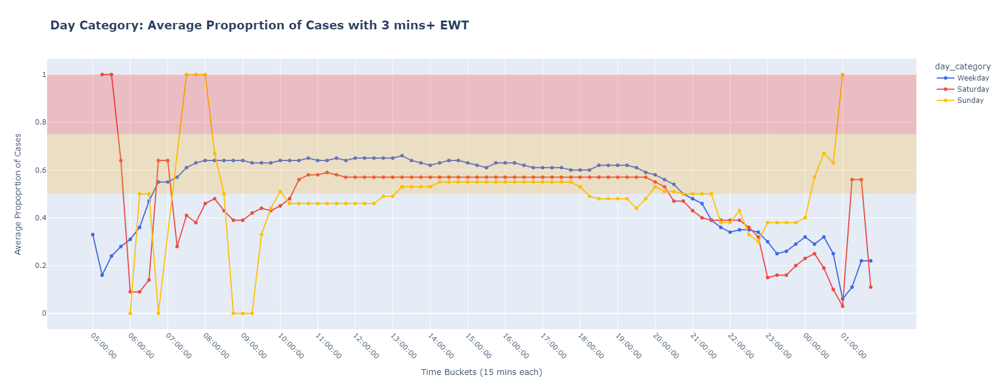

In [17]:
# visualize headways

fig = px.line(
    day_cat_time_bucket_3_min_plus_ewt_percent, 
    x = 'time_buckets', 
    y = 'avg_mins_3_plus',
    color = 'day_category',
    color_discrete_sequence = stib_colors,
    markers = True,
    labels = {
        'time_buckets': 'Time Buckets (15 mins each)',
        'avg_mins_3_plus': 'Average Propoprtion of Cases'
    },
    title = '<span style = "font-size: 20px; font-weight: bold">Day Category: Average Propoprtion of Cases with 3 mins+ EWT</span>'
)

fig.add_hrect(y0 = 0.5, y1 = 0.75, line_width = 0, fillcolor = "orange", opacity = 0.2)
fig.add_hrect(y0 = 0.75, y1 = 1, line_width = 0, fillcolor = "red", opacity = 0.2)
fig.update_xaxes(categoryorder = 'array', categoryarray = day_cat_time_bucket_3_min_plus_ewt_percent.time_buckets.drop_duplicates().tolist())
fig.update_xaxes(ticks = "inside", tickcolor = 'white', tickangle = 45, nticks = 24)
fig.update_layout(
    height = 650
)


fig.show()

In [18]:
# query 

cur.execute(
    f"""
    
    with base as (
        select
          day_category
        , vehicle
        , line
        , direction
        , stop_name
        , stop_seq
        , sched_timegroup
        , timegroup_start_in
        , timegroup_end_ex
        , (count(case when ewt_min < 3 then ewt_min end)::float/count(*)::float)::numeric(9, 2) as mins_less_than_3
        , (count(case when ewt_min >= 3 then ewt_min end)::float/count(*)::float)::numeric(9, 2) as mins_3_plus
        from ewt
        where day_category = 'Weekday'
        group by
              day_category
            , vehicle
            , line
            , direction
            , stop_name
            , stop_seq
            , sched_timegroup
            , timegroup_start_in
            , timegroup_end_ex
    )

    , agg2 as (
        select
          day_category
        , vehicle
        , line
        , direction
        , stop_name
        , stop_seq
        , avg(mins_less_than_3)::numeric(9, 2) as avg_mins_less_than_3
        , avg(mins_3_plus)::numeric(9, 2) as avg_mins_3_plus
        from base
        group by
              day_category
            , vehicle
            , line
            , direction
            , stop_name
            , stop_seq
    )

    , high_cases as (
        select
          day_category
        , vehicle
        , line
        , direction
        , min(stop_seq) as min_stop_seq
        , max(stop_seq) as max_stop_seq
        , avg(avg_mins_3_plus) as avg_3_mins_plus
        from agg2
        where avg_mins_3_plus >= 0.5
        group by
              day_category
            , vehicle
            , line
            , direction
    )

    , check_all as (
        select
          a.day_category
        , a.vehicle
        , a.line
        , a.direction
        , b.min_stop_seq
        , b.max_stop_seq
        , avg(avg_3_mins_plus)::numeric(9, 2) as avg_3_mins_plus
        from agg2 a
        inner join high_cases b
            on a.day_category = b.day_category
            and a.vehicle = b.vehicle
            and a.line = b.line
            and a.direction = b.direction
            and a.stop_seq >= b.min_stop_seq
            and a.stop_seq <= b.max_stop_seq
        where b.max_stop_seq - b.min_stop_seq >= 2
        group by
             a.day_category
            , a.vehicle
            , a.line
            , a.direction
            , b.min_stop_seq
            , b.max_stop_seq
        having avg(avg_3_mins_plus) >= 0.6
    )

    , distinct_lines_stops as (
        select
          distinct
          line
        , direction
        , stop_name
        , stop_seq
        from stop_details_combined
    )

    , join_full_line as (
        select
          a.day_category
        , a.vehicle
        , a.line
        , a.direction
        , b.stop_seq
        , b.stop_name
        , case
            when b.stop_seq >= min_stop_seq and b.stop_seq <= max_stop_seq then '#800000'
            else '#4169e1'
          end as colour_hex 
        from check_all a
        inner join distinct_lines_stops b
            on a.line = b.line
            and a.direction = b.direction
    )

    , intersecting_lines as (
        select
          a.*
        , b.line as int_line
        , b.direction as int_line_direction
        from join_full_line a
        inner join join_full_line b
            on a.vehicle = b.vehicle
            and a.stop_name = b.stop_name
            and a.line != b.line
    )

    , int_stops_seq as (
        select 
          *
        , stop_seq - (lag(stop_seq, 2) over(partition by vehicle, line, direction, int_line, int_line_direction order by stop_seq)) prev_two_stop_seq_diff
        from intersecting_lines
        order by 
              line
            , direction
            , int_line
            , int_line_direction
            , stop_seq
    )

    , three_plus_int_stops as (
        select 
          distinct
          day_category
        , vehicle
        , line
    -- 	, direction
        , int_line
    -- 	, int_line_direction
        from int_stops_seq
        where prev_two_stop_seq_diff = 2
    )

    , int_lines_list as (
        select 
        vehicle,
        line,
        array_agg(int_line) over(partition by vehicle, line order by int_line) as int_lines_list,
        count(int_line) over(partition by vehicle, line order by int_line range between unbounded preceding and unbounded following) as int_lines_count 
        from three_plus_int_stops
    )

    , int_lines_list_full as (
        select
          vehicle
        , line
        , int_lines_count
        , max(int_lines_list) as int_lines_list
        from int_lines_list
        group by
             vehicle
            , line
            , int_lines_count	
        order by int_lines_count desc
    )

    , specific_case as (
        select
        *
        from int_lines_list_full
        where line = '80'
    )

    , lines as (
        select
        distinct
        a.*
        from
        join_full_line a
        inner join three_plus_int_stops b
            on a.line = b.line
            or a.line = b.int_line
        where b.line = '80'
    )

    select 
      a.day_category
    , a.vehicle
    , a.line
    , a.direction
    , stop_seq
    , stop_name
    , case
        when b.avg_3_mins_plus >= 0.5 and  b.avg_3_mins_plus < 0.65 then '#F6BDC0'
        when b.avg_3_mins_plus >= 0.65 and  b.avg_3_mins_plus < 0.8 then '#F07470'
        when b.avg_3_mins_plus >= 0.8 then '#DC1C13'
        else a.colour_hex
      end as colour_hex
    , case
        when b.avg_3_mins_plus is not null then b.avg_3_mins_plus * 100
        else 20
      end as marker_weight
    from lines a
    left join check_all b
        on a.line = b.line
        and a.direction = b.direction
        and a.stop_seq >= b.min_stop_seq
        and a.stop_seq <= b.max_stop_seq
    order by 
        line, 
        direction, 
        stop_seq
    ;
        
    """
)

line_subset_ewt_3_mins_plus = pd.DataFrame(cur.fetchall(), columns = [desc[0] for desc in cur.description])

In [19]:
line_subset_ewt_3_mins_plus.line = line_subset_ewt_3_mins_plus.line.astype('int64')

subset_stops = stib_stops.merge(
    line_subset_ewt_3_mins_plus,
    how = 'inner',
    left_on = ['vehicle', 'line', 'direction', 'stop_seq', 'stop_name'],
    right_on = ['vehicle','line', 'direction', 'stop_seq', 'stop_name']
)

subset_lines = stib_lines.merge(
    line_subset_ewt_3_mins_plus,
    how = 'inner',
    left_on = ['vehicle', 'line', 'direction'],
    right_on = ['vehicle','line', 'direction']
)[['vehicle', 'line', 'direction', 'date_debut', 'date_fin', 'color_hex', 'geometry']].drop_duplicates().reset_index(drop = True)

## **<span style = "color: black"><center>[East of Brussels] Bus Intersecting Lines: 27, 28, 38, 65, 80, 95</center></span>**

In [20]:
# plot interactive map

map_line_subset_ewt_3_mins_plus = fl.Map(
    location = [50.8476, 4.3572],
    tiles = 'CartoDB positron',
    zoom_start = 13,
    control_scale = True
)

for grp_name, df_grp in subset_lines.groupby('line'):
    
    feature_group = fl.FeatureGroup('Line ' + str(grp_name), show = True)
    
    for row in df_grp.itertuples():
        fl.Choropleth(
            geo_data = df_grp, 
            line_color = 'black',
            highlight = True
        ).add_to(feature_group)
        
    for index, data in subset_stops.loc[(subset_stops.line == grp_name)].iterrows():
        fl.Circle(
            location = [data.lat, data.lon], 
            tooltip = data[['vehicle', 'line', 'direction', 'stop_seq', 'stop_name', 'end_stop']].to_dict(), 
            radius = float(data.marker_weight), 
            color = data.colour_hex, 
            fill = True
        ).add_to(feature_group)
    
    feature_group.add_to(map_line_subset_ewt_3_mins_plus)
    
fl.LayerControl(collapsed = False).add_to(map_line_subset_ewt_3_mins_plus)
map_line_subset_ewt_3_mins_plus

In [21]:
# query 

cur.execute(
    f"""
    
    with base as (
        select
          day_category
        , vehicle
        , line
        , direction
        , stop_name
        , stop_seq
        , sched_timegroup
        , timegroup_start_in
        , timegroup_end_ex
        , (count(case when ewt_min < 3 then ewt_min end)::float/count(*)::float)::numeric(9, 2) as mins_less_than_3
        , (count(case when ewt_min >= 3 then ewt_min end)::float/count(*)::float)::numeric(9, 2) as mins_3_plus
        from ewt
        where day_category = 'Weekday'
        group by
              day_category
            , vehicle
            , line
            , direction
            , stop_name
            , stop_seq
            , sched_timegroup
            , timegroup_start_in
            , timegroup_end_ex
    )

    , agg2 as (
        select
          day_category
        , vehicle
        , line
        , direction
        , stop_name
        , stop_seq
        , avg(mins_less_than_3)::numeric(9, 2) as avg_mins_less_than_3
        , avg(mins_3_plus)::numeric(9, 2) as avg_mins_3_plus
        from base
        group by
              day_category
            , vehicle
            , line
            , direction
            , stop_name
            , stop_seq
    )

    , high_cases as (
        select
          day_category
        , vehicle
        , line
        , direction
        , min(stop_seq) as min_stop_seq
        , max(stop_seq) as max_stop_seq
        , avg(avg_mins_3_plus) as avg_3_mins_plus
        from agg2
        where avg_mins_3_plus >= 0.5
        group by
              day_category
            , vehicle
            , line
            , direction
    )

    , check_all as (
        select
          a.day_category
        , a.vehicle
        , a.line
        , a.direction
        , b.min_stop_seq
        , b.max_stop_seq
        , avg(avg_3_mins_plus)::numeric(9, 2) as avg_3_mins_plus
        from agg2 a
        inner join high_cases b
            on a.day_category = b.day_category
            and a.vehicle = b.vehicle
            and a.line = b.line
            and a.direction = b.direction
            and a.stop_seq >= b.min_stop_seq
            and a.stop_seq <= b.max_stop_seq
        where b.max_stop_seq - b.min_stop_seq >= 2
        group by
             a.day_category
            , a.vehicle
            , a.line
            , a.direction
            , b.min_stop_seq
            , b.max_stop_seq
        having avg(avg_3_mins_plus) >= 0.6
    )

    , distinct_lines_stops as (
        select
          distinct
          line
        , direction
        , stop_name
        , stop_seq
        from stop_details_combined
    )

    , join_full_line as (
        select
          a.day_category
        , a.vehicle
        , a.line
        , a.direction
        , b.stop_seq
        , b.stop_name
        , case
            when b.stop_seq >= min_stop_seq and b.stop_seq <= max_stop_seq then '#800000'
            else '#4169e1'
          end as colour_hex 
        from check_all a
        inner join distinct_lines_stops b
            on a.line = b.line
            and a.direction = b.direction
    )

    , intersecting_lines as (
        select
          a.*
        , b.line as int_line
        , b.direction as int_line_direction
        from join_full_line a
        inner join join_full_line b
            on a.vehicle = b.vehicle
            and a.stop_name = b.stop_name
            and a.line != b.line
    )

    , int_stops_seq as (
        select 
          *
        , stop_seq - (lag(stop_seq, 2) over(partition by vehicle, line, direction, int_line, int_line_direction order by stop_seq)) prev_two_stop_seq_diff
        from intersecting_lines
        order by 
              line
            , direction
            , int_line
            , int_line_direction
            , stop_seq
    )

    , three_plus_int_stops as (
        select 
          distinct
          day_category
        , vehicle
        , line
    -- 	, direction
        , int_line
    -- 	, int_line_direction
        from int_stops_seq
        where prev_two_stop_seq_diff = 2
    )

    , int_lines_list as (
        select 
        vehicle,
        line,
        array_agg(int_line) over(partition by vehicle, line order by int_line) as int_lines_list,
        count(int_line) over(partition by vehicle, line order by int_line range between unbounded preceding and unbounded following) as int_lines_count 
        from three_plus_int_stops
    )

    , int_lines_list_full as (
        select
          vehicle
        , line
        , int_lines_count
        , max(int_lines_list) as int_lines_list
        from int_lines_list
        group by
             vehicle
            , line
            , int_lines_count	
        order by int_lines_count desc
    )

    , specific_case as (
        select
        *
        from int_lines_list_full
        where line = '88'
    )

    , lines as (
        select
        distinct
        a.*
        from
        join_full_line a
        inner join three_plus_int_stops b
            on a.line = b.line
            or a.line = b.int_line
        where b.line = '88'
    )

    select 
      a.day_category
    , a.vehicle
    , a.line
    , a.direction
    , stop_seq
    , stop_name
    , case
        when b.avg_3_mins_plus >= 0.5 and  b.avg_3_mins_plus < 0.65 then '#F6BDC0'
        when b.avg_3_mins_plus >= 0.65 and  b.avg_3_mins_plus < 0.8 then '#F07470'
        when b.avg_3_mins_plus >= 0.8 then '#DC1C13'
        else a.colour_hex
      end as colour_hex
    , case
        when b.avg_3_mins_plus is not null then b.avg_3_mins_plus * 100
        else 20
      end as marker_weight
    from lines a
    left join check_all b
        on a.line = b.line
        and a.direction = b.direction
        and a.stop_seq >= b.min_stop_seq
        and a.stop_seq <= b.max_stop_seq
    order by 
        line, 
        direction, 
        stop_seq
    ;
        
    """
)

line_subset_ewt_3_mins_plus = pd.DataFrame(cur.fetchall(), columns = [desc[0] for desc in cur.description])

In [22]:
line_subset_ewt_3_mins_plus.line = line_subset_ewt_3_mins_plus.line.astype('int64')

subset_stops = stib_stops.merge(
    line_subset_ewt_3_mins_plus,
    how = 'inner',
    left_on = ['vehicle', 'line', 'direction', 'stop_seq', 'stop_name'],
    right_on = ['vehicle','line', 'direction', 'stop_seq', 'stop_name']
)

subset_lines = stib_lines.merge(
    line_subset_ewt_3_mins_plus,
    how = 'inner',
    left_on = ['vehicle', 'line', 'direction'],
    right_on = ['vehicle','line', 'direction']
)[['vehicle', 'line', 'direction', 'date_debut', 'date_fin', 'color_hex', 'geometry']].drop_duplicates().reset_index(drop = True)

## **<span style = "color: black"><center>[West of Brussels] Bus Intersecting Lines: 13, 14, 20, 57, 86, 88</center></span>**

In [23]:
# plot interactive map

map_line_subset_ewt_3_mins_plus = fl.Map(
    location = [50.8476, 4.3572],
    tiles = 'CartoDB positron',
    zoom_start = 13,
    control_scale = True
)

for grp_name, df_grp in subset_lines.groupby('line'):
    
    feature_group = fl.FeatureGroup('Line ' + str(grp_name), show = True)
    
    for row in df_grp.itertuples():
        fl.Choropleth(
            geo_data = df_grp, 
            line_color = 'black',
            highlight = True
        ).add_to(feature_group)
        
    for index, data in subset_stops.loc[(subset_stops.line == grp_name)].iterrows():
        fl.Circle(
            location = [data.lat, data.lon], 
            tooltip = data[['vehicle', 'line', 'direction', 'stop_seq', 'stop_name', 'end_stop']].to_dict(), 
            radius = float(data.marker_weight), 
            color = data.colour_hex, 
            fill = True
        ).add_to(feature_group)
    
    feature_group.add_to(map_line_subset_ewt_3_mins_plus)
    
fl.LayerControl(collapsed = False).add_to(map_line_subset_ewt_3_mins_plus)
map_line_subset_ewt_3_mins_plus

In [24]:
# query 

cur.execute(
    f"""
    
    with base as (
        select
          day_category
        , vehicle
        , line
        , direction
        , stop_name
        , stop_seq
        , sched_timegroup
        , timegroup_start_in
        , timegroup_end_ex
        , (count(case when ewt_min < 3 then ewt_min end)::float/count(*)::float)::numeric(9, 2) as mins_less_than_3
        , (count(case when ewt_min >= 3 then ewt_min end)::float/count(*)::float)::numeric(9, 2) as mins_3_plus
        from ewt
        where day_category = 'Weekday'
        group by
              day_category
            , vehicle
            , line
            , direction
            , stop_name
            , stop_seq
            , sched_timegroup
            , timegroup_start_in
            , timegroup_end_ex
    )

    , agg2 as (
        select
          day_category
        , vehicle
        , line
        , direction
        , stop_name
        , stop_seq
        , avg(mins_less_than_3)::numeric(9, 2) as avg_mins_less_than_3
        , avg(mins_3_plus)::numeric(9, 2) as avg_mins_3_plus
        from base
        group by
              day_category
            , vehicle
            , line
            , direction
            , stop_name
            , stop_seq
    )

    , high_cases as (
        select
          day_category
        , vehicle
        , line
        , direction
        , min(stop_seq) as min_stop_seq
        , max(stop_seq) as max_stop_seq
        , avg(avg_mins_3_plus) as avg_3_mins_plus
        from agg2
        where avg_mins_3_plus >= 0.5
        group by
              day_category
            , vehicle
            , line
            , direction
    )

    , check_all as (
        select
          a.day_category
        , a.vehicle
        , a.line
        , a.direction
        , b.min_stop_seq
        , b.max_stop_seq
        , avg(avg_3_mins_plus)::numeric(9, 2) as avg_3_mins_plus
        from agg2 a
        inner join high_cases b
            on a.day_category = b.day_category
            and a.vehicle = b.vehicle
            and a.line = b.line
            and a.direction = b.direction
            and a.stop_seq >= b.min_stop_seq
            and a.stop_seq <= b.max_stop_seq
        where b.max_stop_seq - b.min_stop_seq >= 2
        group by
             a.day_category
            , a.vehicle
            , a.line
            , a.direction
            , b.min_stop_seq
            , b.max_stop_seq
        having avg(avg_3_mins_plus) >= 0.6
    )

    , distinct_lines_stops as (
        select
          distinct
          line
        , direction
        , stop_name
        , stop_seq
        from stop_details_combined
    )

    , join_full_line as (
        select
          a.day_category
        , a.vehicle
        , a.line
        , a.direction
        , b.stop_seq
        , b.stop_name
        , case
            when b.stop_seq >= min_stop_seq and b.stop_seq <= max_stop_seq then '#800000'
            else '#4169e1'
          end as colour_hex 
        from check_all a
        inner join distinct_lines_stops b
            on a.line = b.line
            and a.direction = b.direction
    )

    , intersecting_lines as (
        select
          a.*
        , b.line as int_line
        , b.direction as int_line_direction
        from join_full_line a
        inner join join_full_line b
            on a.vehicle = b.vehicle
            and a.stop_name = b.stop_name
            and a.line != b.line
    )

    , int_stops_seq as (
        select 
          *
        , stop_seq - (lag(stop_seq, 2) over(partition by vehicle, line, direction, int_line, int_line_direction order by stop_seq)) prev_two_stop_seq_diff
        from intersecting_lines
        order by 
              line
            , direction
            , int_line
            , int_line_direction
            , stop_seq
    )

    , three_plus_int_stops as (
        select 
          distinct
          day_category
        , vehicle
        , line
    -- 	, direction
        , int_line
    -- 	, int_line_direction
        from int_stops_seq
        where prev_two_stop_seq_diff = 2
    )

    , int_lines_list as (
        select 
        vehicle,
        line,
        array_agg(int_line) over(partition by vehicle, line order by int_line) as int_lines_list,
        count(int_line) over(partition by vehicle, line order by int_line range between unbounded preceding and unbounded following) as int_lines_count 
        from three_plus_int_stops
    )

    , int_lines_list_full as (
        select
          vehicle
        , line
        , int_lines_count
        , max(int_lines_list) as int_lines_list
        from int_lines_list
        group by
             vehicle
            , line
            , int_lines_count	
        order by int_lines_count desc
    )

    , specific_case as (
        select
        *
        from int_lines_list_full
        where line = '51'
    )

    , lines as (
        select
        distinct
        a.*
        from
        join_full_line a
        inner join three_plus_int_stops b
            on a.line = b.line
            or a.line = b.int_line
        where b.line = '51'
    )

    select 
      a.day_category
    , a.vehicle
    , a.line
    , a.direction
    , stop_seq
    , stop_name
    , case
        when b.avg_3_mins_plus >= 0.5 and  b.avg_3_mins_plus < 0.65 then '#F6BDC0'
        when b.avg_3_mins_plus >= 0.65 and  b.avg_3_mins_plus < 0.8 then '#F07470'
        when b.avg_3_mins_plus >= 0.8 then '#DC1C13'
        else a.colour_hex
      end as colour_hex
    , case
        when b.avg_3_mins_plus is not null then b.avg_3_mins_plus * 100
        else 20
      end as marker_weight
    from lines a
    left join check_all b
        on a.line = b.line
        and a.direction = b.direction
        and a.stop_seq >= b.min_stop_seq
        and a.stop_seq <= b.max_stop_seq
    order by 
        line, 
        direction, 
        stop_seq
    ;
        
    """
)

line_subset_ewt_3_mins_plus = pd.DataFrame(cur.fetchall(), columns = [desc[0] for desc in cur.description])

In [25]:
line_subset_ewt_3_mins_plus.line = line_subset_ewt_3_mins_plus.line.astype('int64')

subset_stops = stib_stops.merge(
    line_subset_ewt_3_mins_plus,
    how = 'inner',
    left_on = ['vehicle', 'line', 'direction', 'stop_seq', 'stop_name'],
    right_on = ['vehicle','line', 'direction', 'stop_seq', 'stop_name']
)

subset_lines = stib_lines.merge(
    line_subset_ewt_3_mins_plus,
    how = 'inner',
    left_on = ['vehicle', 'line', 'direction'],
    right_on = ['vehicle','line', 'direction']
)[['vehicle', 'line', 'direction', 'date_debut', 'date_fin', 'color_hex', 'geometry']].drop_duplicates().reset_index(drop = True)

## **<span style = "color: black"><center>[Centre of Brussels] Tram Intersecting Lines: 03, 04, 51, 82, 92</center></span>**

In [26]:
# plot interactive map

map_line_subset_ewt_3_mins_plus = fl.Map(
    location = [50.8476, 4.3572],
    tiles = 'CartoDB positron',
    zoom_start = 13,
    control_scale = True
)

for grp_name, df_grp in subset_lines.groupby('line'):
    
    feature_group = fl.FeatureGroup('Line ' + str(grp_name), show = True)
    
    for row in df_grp.itertuples():
        fl.Choropleth(
            geo_data = df_grp, 
            line_color = 'black',
            highlight = True
        ).add_to(feature_group)
        
    for index, data in subset_stops.loc[(subset_stops.line == grp_name)].iterrows():
        fl.Circle(
            location = [data.lat, data.lon], 
            tooltip = data[['vehicle', 'line', 'direction', 'stop_seq', 'stop_name', 'end_stop']].to_dict(), 
            radius = float(data.marker_weight), 
            color = data.colour_hex, 
            fill = True
        ).add_to(feature_group)
    
    feature_group.add_to(map_line_subset_ewt_3_mins_plus)
    
fl.LayerControl(collapsed = False).add_to(map_line_subset_ewt_3_mins_plus)
map_line_subset_ewt_3_mins_plus

In [27]:
# close cursor connection to db

# cur.close()

## End.